In [1]:
# CSC 732 Final Part 2 Problem 1 Relu Softmax Adam Test Case
# Dominic Klusek, Jonathan Rozen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

<h2>Dataset Information</h2>
<p>Beginner set of 16,000 custom images for categorizing polyhedral dice. 
    Polyhedral dice vary in color, and images are taken at different angles over different background types: blank, colored, and wood. All images were created, edited, and sorted by Mario Lurig.

Fixed camera positions (minimum 2 angles) used to capture video on a rotating platform with two white lights
Minimum 5 different dice used on 6 different backgrounds (white and various colors)
Video was then exported as images and then batch cropped to 480x480
Handheld camera moved over 5+ dice on various wood surfaces (minimum 2) using natural lighting
Video edited and exported to images then batch cropped to 480x480
Images that were partially out of crop were manually removed
</p>

<ul>
    <li><strong>Number of Instances: </strong>16,000</li>
    <li><strong>Number of Classes: </strong>6</li>
    <li><strong>Image Dimensions: </strong>480x480</li>
    <li><strong>Number of Channels: </strong>3</li>
</ul>

In [2]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D, MaxPooling2D 
from keras.layers.core import Flatten, Dropout, Dense, Activation
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras import backend as K
from skimage import transform
from sklearn.utils import shuffle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tqdm
import pickle
import os
import glob

Using TensorFlow backend.


In [3]:
# set some hyper parameters for training
batch_size = 32
num_classes = 6
num_epochs = 50

<h2>View Dataset Frequencies</h2>

In [4]:
# find files in each folder of dataset
d4_list = os.listdir('Datasets/Dice/dataset/d4')
d6_list = os.listdir('Datasets/Dice/dataset/d6')
d8_list = os.listdir('Datasets/Dice/dataset/d8')
d10_list = os.listdir('Datasets/Dice/dataset/d10')
d12_list = os.listdir('Datasets/Dice/dataset/d12')
d20_list = os.listdir('Datasets/Dice/dataset/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)

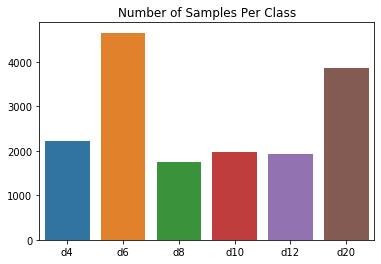

In [5]:
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples Per Class")
plt.show()

In [6]:
train_size = 0
validation_size = 0
test_size = 0
# find size of training set
d4_list = os.listdir('Datasets/train/d4')
d6_list = os.listdir('Datasets/train/d6')
d8_list = os.listdir('Datasets/train/d8')
d10_list = os.listdir('Datasets/train/d10')
d12_list = os.listdir('Datasets/train/d12')
d20_list = os.listdir('Datasets/train/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
train_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size

# find size of validation set
d4_list = os.listdir('Datasets/val/d4')
d6_list = os.listdir('Datasets/val/d6')
d8_list = os.listdir('Datasets/val/d8')
d10_list = os.listdir('Datasets/val/d10')
d12_list = os.listdir('Datasets/val/d12')
d20_list = os.listdir('Datasets/val/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
validation_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size

# find size of test set
d4_list = os.listdir('Datasets/test/d4')
d6_list = os.listdir('Datasets/test/d6')
d8_list = os.listdir('Datasets/test/d8')
d10_list = os.listdir('Datasets/test/d10')
d12_list = os.listdir('Datasets/test/d12')
d20_list = os.listdir('Datasets/test/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
test_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size

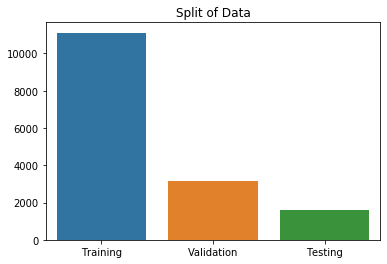

In [7]:
sns.barplot([0,1,2], [train_size, validation_size, test_size])
plt.xticks(range(3), ['Training', 'Validation', 'Testing'])
plt.title("Split of Data")
plt.show()

Samples for Training Set
D4 :  1603
D6 :  3301
D8 :  1096
D10 :  1379
D12 :  1142
D20 :  2590


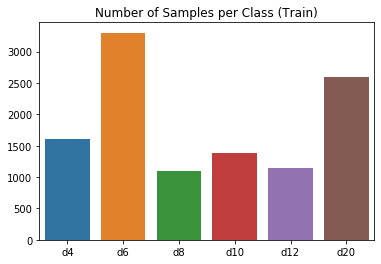

Samples for Validation Set
D4 :  484
D6 :  942
D8 :  321
D10 :  378
D12 :  338
D20 :  712


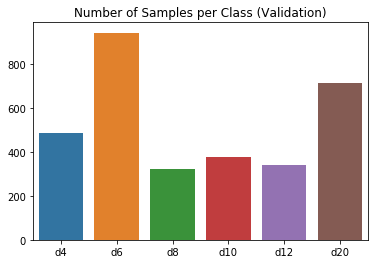

Samples for Testing Set
D4 :  205
D6 :  470
D8 :  147
D10 :  219
D12 :  176
D20 :  359


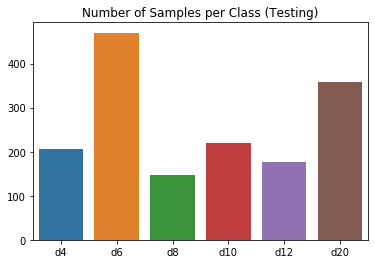

In [8]:
train_size = 0
validation_size = 0
test_size = 0
# find size of training set
d4_list = os.listdir('Datasets/train/d4')
d6_list = os.listdir('Datasets/train/d6')
d8_list = os.listdir('Datasets/train/d8')
d10_list = os.listdir('Datasets/train/d10')
d12_list = os.listdir('Datasets/train/d12')
d20_list = os.listdir('Datasets/train/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
print("Samples for Training Set")
print("D4 : ", d4_size)
print("D6 : ", d6_size)
print("D8 : ", d8_size)
print("D10 : ", d10_size)
print("D12 : ", d12_size)
print("D20 : ", d20_size)
train_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples per Class (Train)")
plt.show()

# find size of validation set
d4_list = os.listdir('Datasets/val/d4')
d6_list = os.listdir('Datasets/val/d6')
d8_list = os.listdir('Datasets/val/d8')
d10_list = os.listdir('Datasets/val/d10')
d12_list = os.listdir('Datasets/val/d12')
d20_list = os.listdir('Datasets/val/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
print("Samples for Validation Set")
print("D4 : ", d4_size)
print("D6 : ", d6_size)
print("D8 : ", d8_size)
print("D10 : ", d10_size)
print("D12 : ", d12_size)
print("D20 : ", d20_size)
validation_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples per Class (Validation)")
plt.show()

# find size of test set
d4_list = os.listdir('Datasets/test/d4')
d6_list = os.listdir('Datasets/test/d6')
d8_list = os.listdir('Datasets/test/d8')
d10_list = os.listdir('Datasets/test/d10')
d12_list = os.listdir('Datasets/test/d12')
d20_list = os.listdir('Datasets/test/d20')
d4_size = len(d4_list)
d6_size = len(d6_list)
d8_size = len(d8_list)
d10_size = len(d10_list)
d12_size = len(d12_list)
d20_size = len(d20_list)
print("Samples for Testing Set")
print("D4 : ", d4_size)
print("D6 : ", d6_size)
print("D8 : ", d8_size)
print("D10 : ", d10_size)
print("D12 : ", d12_size)
print("D20 : ", d20_size)
test_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples per Class (Testing)")
plt.show()

<h2>Load Dataset</h2>

In [9]:
# create image generator
datagenerator = ImageDataGenerator(
rescale=1./255.,
rotation_range=40,
width_shift_range=0.2,
height_shift_range=0.2,
shear_range=0.2,
zoom_range=0.2)

In [10]:
# lists to hold train images and train labels
X_train = []
Y_train = []

# load in images and labels based on how generators label data
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d4/*.jpg')):
    # append original image
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(3)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_train.append(img_tensor)
    Y_train.append(3)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d6/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(4)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d8/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(5)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_train.append(img_tensor)
    Y_train.append(5)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d10/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(0)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_train.append(img_tensor)
    Y_train.append(0)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d12/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100,3))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(1)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_train.append(img_tensor)
    Y_train.append(1)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/train/d20/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_train.append(image)
    Y_train.append(2)
    
# convert lists to arrays
X_train = np.array(X_train)
Y_train = np.array(Y_train)

100%|██████████████████████████████████████████████████████████████████████████████| 2590/2590 [00:58<00:00, 44.36it/s]


In [11]:
# lists to hold val images and val labels
X_val = []
Y_val = []

# load in images and labels based on how generators label data
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d4/*.jpg')):
    # append original image
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(3)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_val.append(img_tensor)
    Y_val.append(3)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d6/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(4)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d8/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(5)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_val.append(img_tensor)
    Y_val.append(5)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d10/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(0)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_val.append(img_tensor)
    Y_val.append(0)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d12/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100,3))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(1)
    
    # create some random images, and append to list
    img_tensor = image
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    X_val.append(img_tensor)
    Y_val.append(1)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/val/d20/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_val.append(image)
    Y_val.append(2)
    
# convert lists to arrays
X_val = np.array(X_val)
Y_val = np.array(Y_val)

100%|████████████████████████████████████████████████████████████████████████████████| 712/712 [00:16<00:00, 43.83it/s]


In [12]:
# lists to hold test images and test labels
X_test = []
Y_test = []

# load in images and labels based on how generators label data
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d4/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(3)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d6/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(4)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d8/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(5)
    
# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d10/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(0)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d12/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100,3))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(1)

# for each file in class folder
for file in tqdm.tqdm(glob.glob('Datasets/test/d20/*.jpg')):
    # load image
    image = plt.imread(file)
    # resize to 100x100
    image = transform.resize(image, (100,100))
    # append image and label to appropriate lists
    X_test.append(image)
    Y_test.append(2)
    
# convert lists to arrays
X_test = np.array(X_test)
Y_test = np.array(Y_test)

100%|████████████████████████████████████████████████████████████████████████████████| 359/359 [00:07<00:00, 45.63it/s]


Samples for Training Set
D4 :  2758
D6 :  2284
D8 :  2590
D10 :  3206
D12 :  3301
D20 :  2192


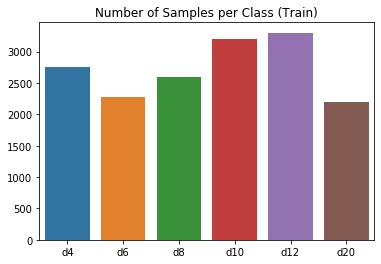

Samples for Validation Set
D4 :  756
D6 :  676
D8 :  712
D10 :  968
D12 :  942
D20 :  642


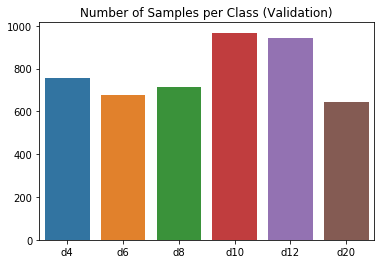

In [13]:
# find size of training set
unique, counts = np.unique(Y_train, return_counts=True)
d4_size, d6_size, d8_size, d10_size, d12_size, d20_size = counts
print("Samples for Training Set")
print("D4 : ", d4_size)
print("D6 : ", d6_size)
print("D8 : ", d8_size)
print("D10 : ", d10_size)
print("D12 : ", d12_size)
print("D20 : ", d20_size)
train_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples per Class (Train)")
plt.show()

# find size of validation set
unique, counts = np.unique(Y_val, return_counts=True)
# find size of training set
d4_size, d6_size, d8_size, d10_size, d12_size, d20_size = counts
print("Samples for Validation Set")
print("D4 : ", d4_size)
print("D6 : ", d6_size)
print("D8 : ", d8_size)
print("D10 : ", d10_size)
print("D12 : ", d12_size)
print("D20 : ", d20_size)
validation_size = d4_size + d6_size + d8_size + d10_size + d12_size + d20_size
sns.barplot([0,1,2,3,4,5], [d4_size, d6_size, d8_size, d10_size, d12_size, d20_size])
plt.xticks(range(6), ['d4', 'd6', 'd8', 'd10', 'd12', 'd20'])
plt.title("Number of Samples per Class (Validation)")
plt.show()

In [14]:
from sklearn.preprocessing import OneHotEncoder

In [15]:
#shuffle datasets
X_train, Y_train = shuffle(X_train, Y_train)
X_val, Y_val = shuffle(X_val, Y_val)
X_test, Y_test = shuffle(X_test, Y_test)
# convert class labels to categorical
encoder = OneHotEncoder(sparse=False)
encoder.fit(np.expand_dims(Y_train, axis=1))
Y_train_cat = encoder.transform(np.expand_dims(Y_train, axis=1))
Y_val_cat = encoder.transform(np.expand_dims(Y_val, axis=1))
Y_test_cat = encoder.transform(np.expand_dims(Y_test, axis=1))

<h2>Build/Train Model</h2>

In [16]:
# build the model
model = Sequential()
model.add(Conv2D(32, (3, 3), kernel_initializer='glorot_uniform', input_shape=(100, 100, 3)))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(64, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(128, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(128, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Flatten())
model.add(Dense(512, kernel_initializer='glorot_uniform', use_bias=False))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(6, kernel_initializer='glorot_uniform'))
model.add(Activation('softmax'))

In [17]:
# compile the model to use binary crossentropy and use RMSProp optimizer
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['acc'])

In [18]:
history = model.fit(X_train, 
                    Y_train_cat,
                    batch_size=batch_size,
                    epochs=num_epochs,
                    verbose=1, shuffle=True, validation_data=[X_val, Y_val_cat])

Train on 16331 samples, validate on 4696 samples
Epoch 1/50
16331/16331 [==============================] - 15s 910us/step - loss: 1.1294 - acc: 0.5694 - val_loss: 0.9324 - val_acc: 0.6267
Epoch 2/50
16331/16331 [==============================] - 13s 799us/step - loss: 0.3705 - acc: 0.8696 - val_loss: 0.3755 - val_acc: 0.8803
Epoch 3/50
16331/16331 [==============================] - 13s 796us/step - loss: 0.2111 - acc: 0.9317 - val_loss: 0.2063 - val_acc: 0.9265
Epoch 4/50
16331/16331 [==============================] - 13s 797us/step - loss: 0.1678 - acc: 0.9431 - val_loss: 0.3483 - val_acc: 0.8912
Epoch 5/50
16331/16331 [==============================] - 14s 827us/step - loss: 0.1327 - acc: 0.9562 - val_loss: 0.1064 - val_acc: 0.9695
Epoch 6/50
16331/16331 [==============================] - 13s 823us/step - loss: 0.1108 - acc: 0.9649 - val_loss: 0.2331 - val_acc: 0.9242
Epoch 7/50
16331/16331 [==============================] - 13s 823us/step - loss: 0.1016 - acc: 0.9679 - val_loss: 0.1

In [19]:
# save the model for future use 
model.save('dice_relu_softmax_Adam_less_steps.h5')

<h2>Evaluate Performance</h2>

In [20]:
#model.load_weights('cats_and_dogs_relu_sigmoid_Adam.h5')
# Evaluate classifier with test image generator
evaluation = model.evaluate(X_test, Y_test_cat, verbose=1)
print("Test Loss: %.4f" % evaluation[0])
print("Test Accuracy: %.4f" % (evaluation[1]*100))

1576/1576 [==============================] - 1s 428us/step
Test Loss: 0.0381
Test Accuracy: 99.4289


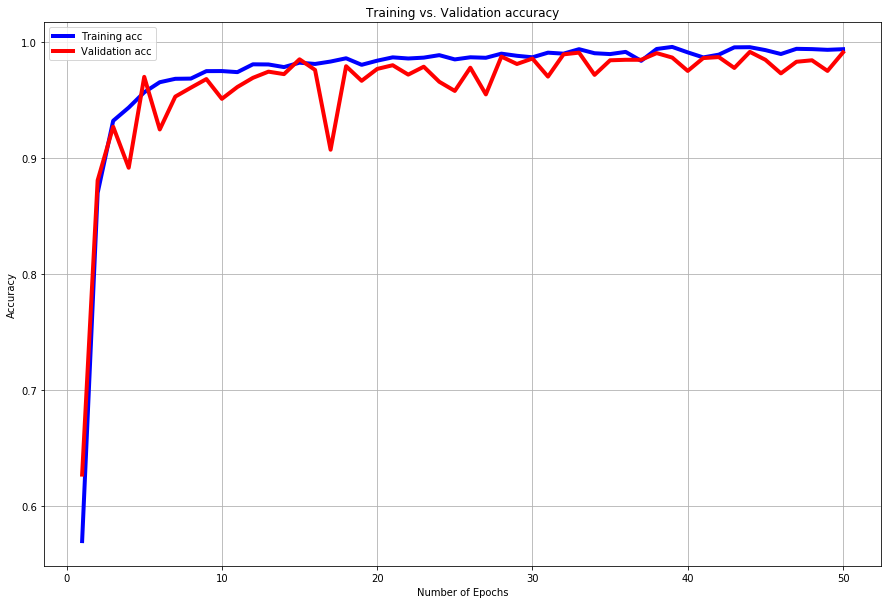

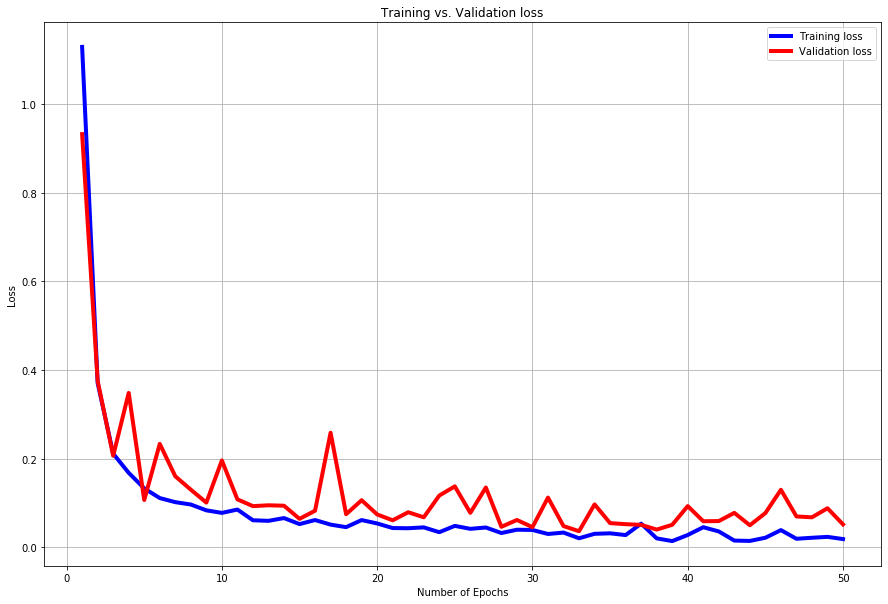

In [21]:
# plot accuracy and loss plots
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.figure(facecolor='w', figsize=(15,10))
plt.plot(epochs, acc, 'b', label='Training acc', lw=4)
plt.plot(epochs, val_acc, 'r', label='Validation acc', lw=4)
plt.title('Training vs. Validation accuracy')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.figure(facecolor='w', figsize=(15,10))
plt.plot(epochs, loss, 'b', label='Training loss', lw=4)
plt.plot(epochs, val_loss, 'r', label='Validation loss', lw=4)
plt.title('Training vs. Validation loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [22]:
# shuffle dataset manually because model did it before
X_test, Y_test_cat = shuffle(X_test, Y_test_cat)
# predict labels
predictions = model.predict(X_test)

In [23]:
from sklearn.metrics import r2_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error, roc_curve, auc, confusion_matrix
from scipy import interp
from itertools import cycle

C:\Users\kluse\Anaconda3\envs\MLearning\lib\site-packages\ipykernel_launcher.py:19: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


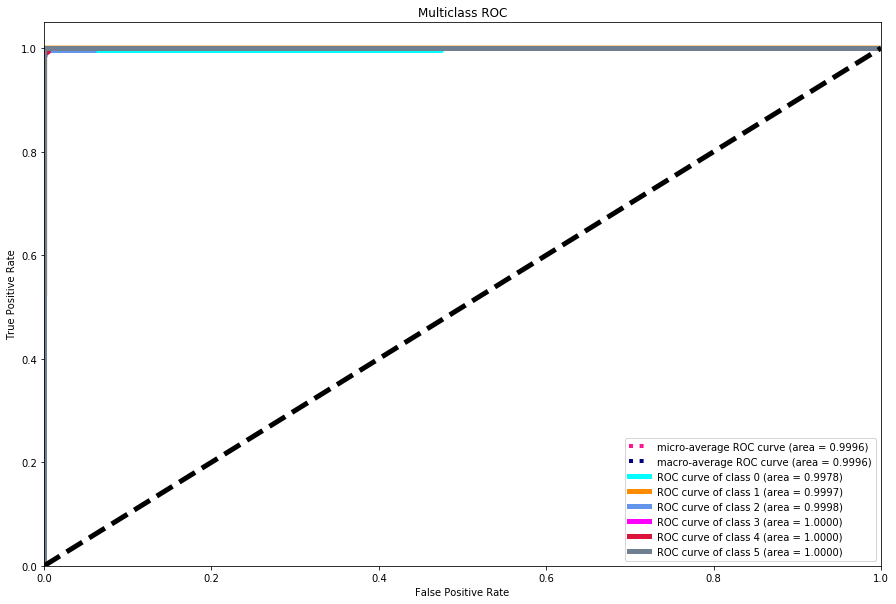

In [24]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(6):
    fpr[i], tpr[i], _ = roc_curve(Y_test_cat[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_cat.ravel(), predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(6)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(6):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= 6

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# set line width of graphs
lw = 5

# Plot all ROC curves
plt.figure(figsize=(15,10), facecolor='w')
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.4f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.4f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'fuchsia', 'crimson', 'slategray'])
for i, color in zip(range(6), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.4f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC')
plt.legend(loc="lower right")
plt.show()

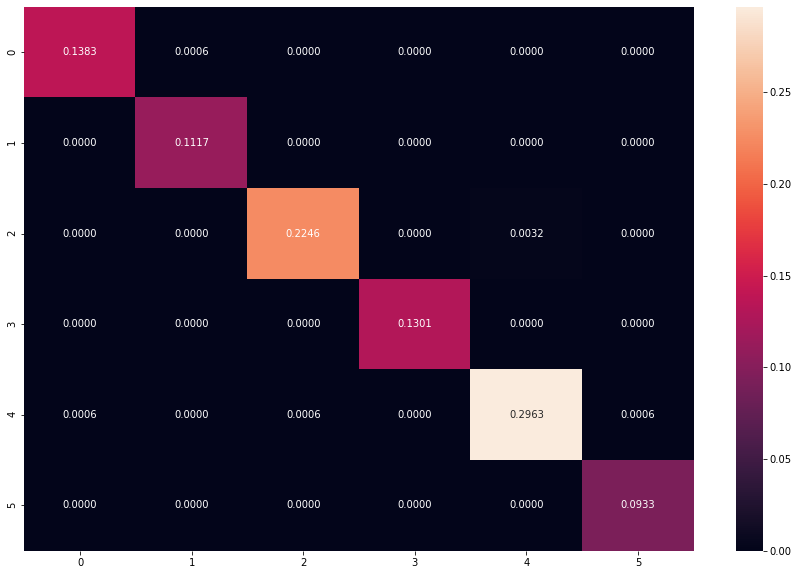

In [25]:
# plot confusion matrix
plt.figure(figsize=(15,10), facecolor='w')
numerical_Y_test = encoder.inverse_transform(Y_test_cat)[:,0]
numerical_predictions = np.argmax(predictions, axis=-1)
sns.heatmap(confusion_matrix(numerical_Y_test, numerical_predictions, normalize='all'), fmt='.4f', annot=True)

In [26]:
# print classification report to find Precision, Recall, and F1-score
print(classification_report(numerical_Y_test, numerical_predictions, digits=4))

              precision    recall  f1-score   support

           0     0.9954    0.9954    0.9954       219
           1     0.9944    1.0000    0.9972       176
           2     0.9972    0.9861    0.9916       359
           3     1.0000    1.0000    1.0000       205
           4     0.9894    0.9936    0.9915       470
           5     0.9932    1.0000    0.9966       147

    accuracy                         0.9943      1576
   macro avg     0.9949    0.9959    0.9954      1576
weighted avg     0.9943    0.9943    0.9943      1576



<h2>Visualize Predictions</h2>

In [27]:
# lists to hold some correct and incorrectly classified images
correct_indices = []
incorrect_indices = []

for i in range(numerical_Y_test.shape[0]):
    # check if we have a correct match if so append to list
    if(numerical_Y_test[i] == numerical_predictions[i]):
        correct_indices.append(i)
        # stop when we reach 12 examples
        if(len(correct_indices) == 12):
            break

for i in range(numerical_Y_test.shape[0]):
    # check if we have a incorrect match if so append to list
    if(numerical_Y_test[i] != numerical_predictions[i]):
        incorrect_indices.append(i)
        # stop when we reach 12 examples
        if(len(incorrect_indices) == 12):
            break

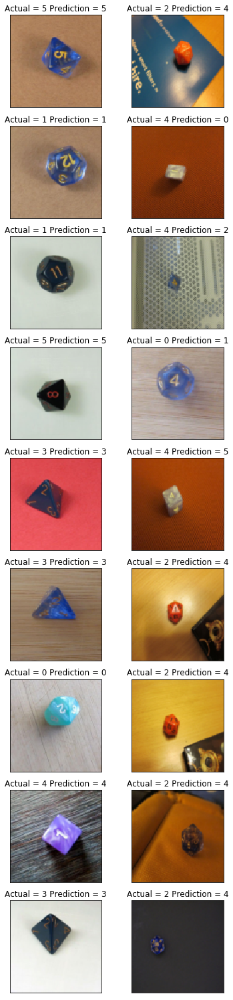

In [28]:
index = 1
plt.figure(figsize=(6,36))
for correct, incorrect in zip(correct_indices, incorrect_indices):
    plt.subplot(12, 2, index)
    plt.imshow(X_test[correct])
    plt.title("Actual = %s Prediction = %s" % (numerical_Y_test[correct], numerical_predictions[correct]))
    plt.xticks([])
    plt.yticks([])
    plt.subplot(12, 2, index+1)
    plt.imshow(X_test[incorrect])
    plt.title("Actual = %s Prediction = %s" % (numerical_Y_test[incorrect], numerical_predictions[incorrect]))
    plt.xticks([])
    plt.yticks([])
    index = index + 2

<h2>Visual Activation Maps</h2>

In [29]:
from keras.preprocessing import image
import numpy as np

#create list of randomly augmented images of dice
dice_images = []

for i in range(2):
    img = image.load_img("Datasets/val/d4/13136.jpg", target_size=(100,100))
    img_tensor = image.img_to_array(img)
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("Datasets/val/d6/13123.jpg", target_size=(100,100))
    img_tensor = image.img_to_array(img)
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("Datasets/val/d8/13541.jpg", target_size=(100,100))
    img_tensor = image.img_to_array(img)
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("Datasets/val/d12/15317.jpg", target_size=(100,100))
    img_tensor = image.img_to_array(img)
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("Datasets/val/d20/14088.jpg", target_size=(100,100))
    img_tensor = image.img_to_array(img)
    img_tensor = datagenerator.apply_transform(img_tensor, datagenerator.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

In [30]:
from keras import models
layer_outputs = [layer.output for layer in model.layers]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

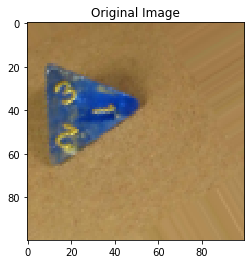

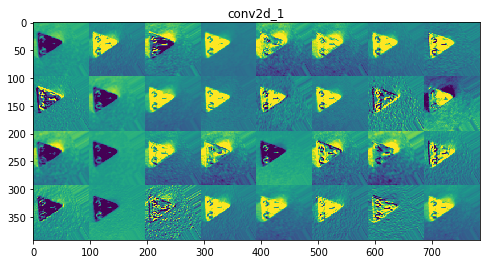

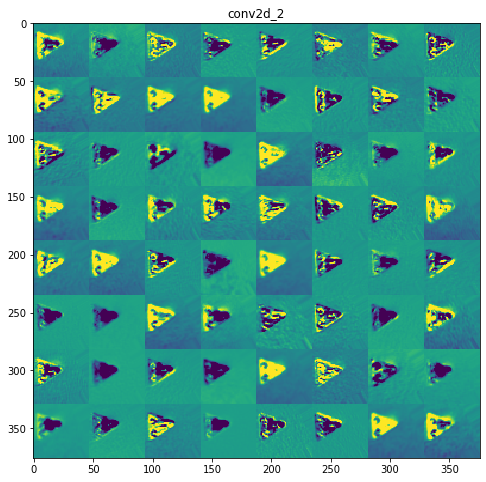

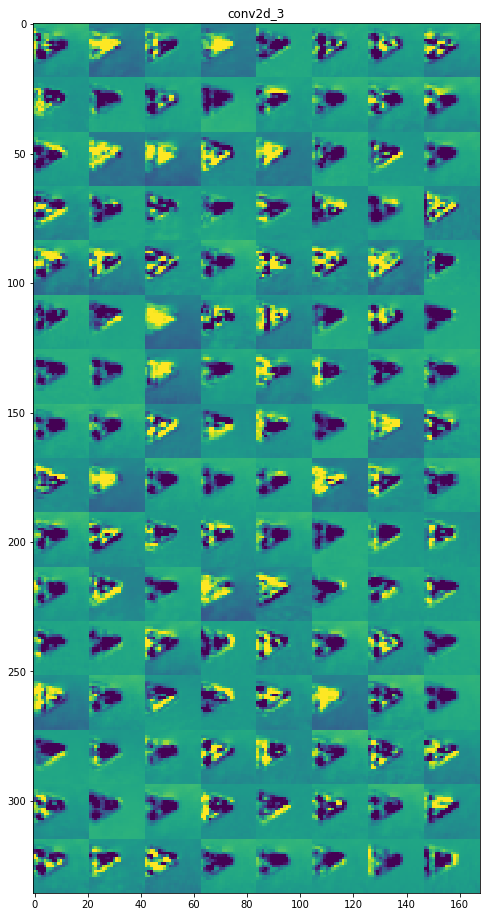

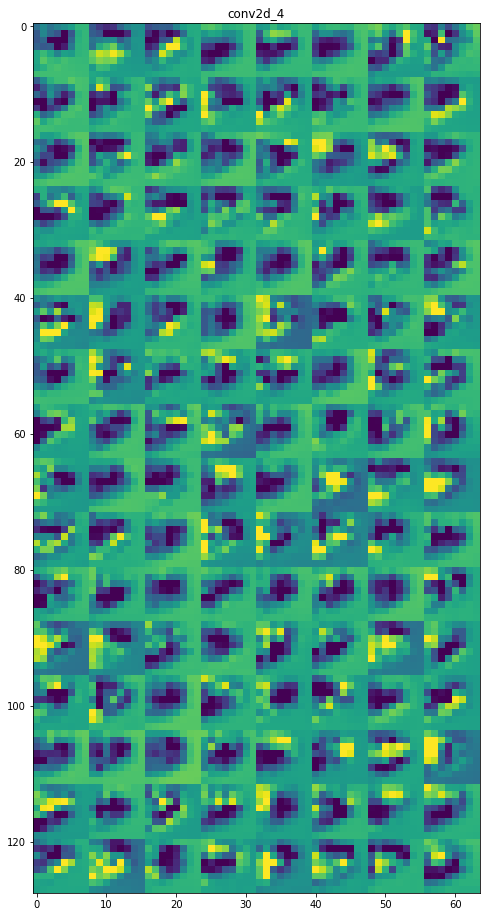

...

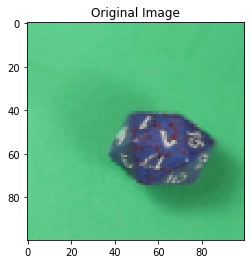

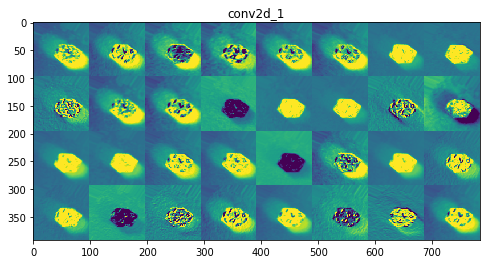

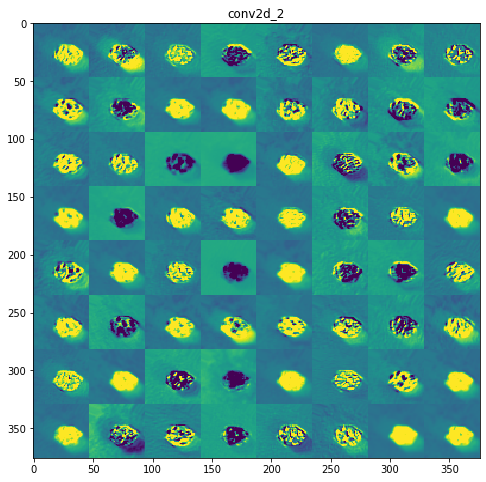

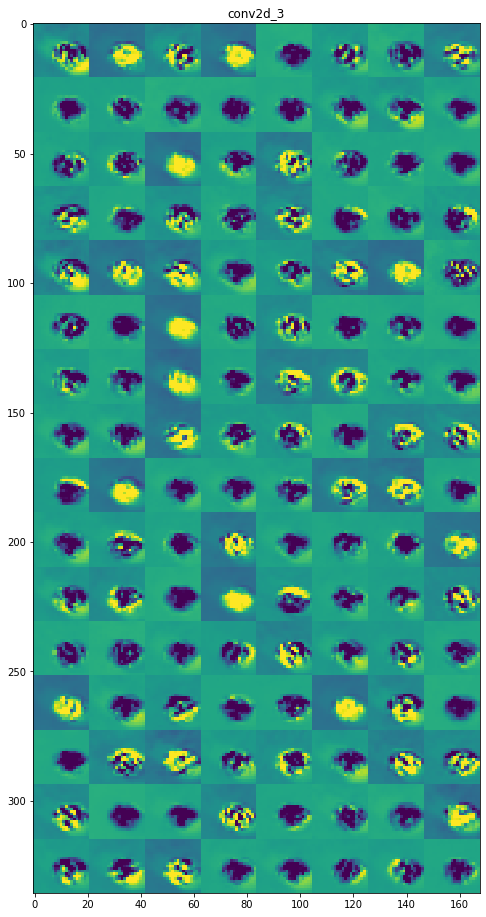

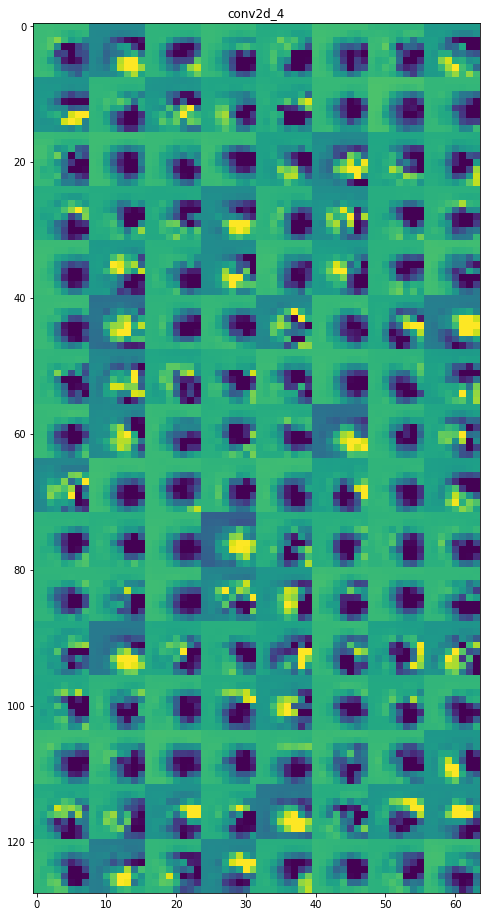

In [31]:
import numpy as np
import time
for img in dice_images:
    plt.figure(facecolor='w')
    plt.title("Original Image")
    plt.imshow(img[0])
    activations = activation_model.predict(img)
    layer_names = [layer.name for layer in model.layers]
    images_per_row = 8

    for layer_name, layer_activation in zip(layer_names, activations):
        # skiip none convolutional layers
        if(layer_name.find('conv') == -1):
            continue
        n_features = layer_activation.shape[-1]
    
        size = layer_activation.shape[1]
    
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,:, :,col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image 

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],scale * display_grid.shape[0]), facecolor='w')
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()

<p>Visualizing the activation maps when the CNN makes a prediction is a good way to visualize the type of data that is being collected and how it is abstracted by later layers. For instance when we look at the first layer conv2d_1 seems to collect some fur texture, silhouette, contours, and other such data; then conv2d_2 collects similar data, then for other layers the data becomes more generalized and abstract compared to the first 2 layers due to the dimensionality reduction. We can also see all the filters that do not contribute much or those that have been set to 0 by the dropout function.</p>

<h2>Visualizing Filters</h2>

In [32]:
def deprocess_image(x):
    """utility function to convert a float array into a valid uint8 image.

    # Arguments
        x: A numpy-array representing the generated image.

    # Returns
        A processed numpy-array, which could be used in e.g. imshow.
    """
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [33]:
def generate_pattern(layer_name, filter_index, size=100):
    layer_output = model.get_layer(layer_name).output
    #print(layer_output.shape)
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    #print(input_img_data.shape)
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)

In [34]:
#model = load_model('cats_and_dogs_small_2.h5')
layer_names = [layer.name for layer in model.layers]
layer_output = model.get_layer(layer_names[0]).output
print(layer_names)
print(len(layer_names))

['conv2d_1', 'activation_1', 'max_pooling2d_1', 'dropout_1', 'conv2d_2', 'activation_2', 'max_pooling2d_2', 'dropout_2', 'conv2d_3', 'activation_3', 'max_pooling2d_3', 'dropout_3', 'conv2d_4', 'activation_4', 'max_pooling2d_4', 'dropout_4', 'flatten_1', 'dense_1', 'activation_5', 'batch_normalization_1', 'dropout_5', 'dense_2', 'activation_6']
23


Tensor("activation_1/Relu:0", shape=(None, 98, 98, 32), dtype=float32)
32
(8, 4)


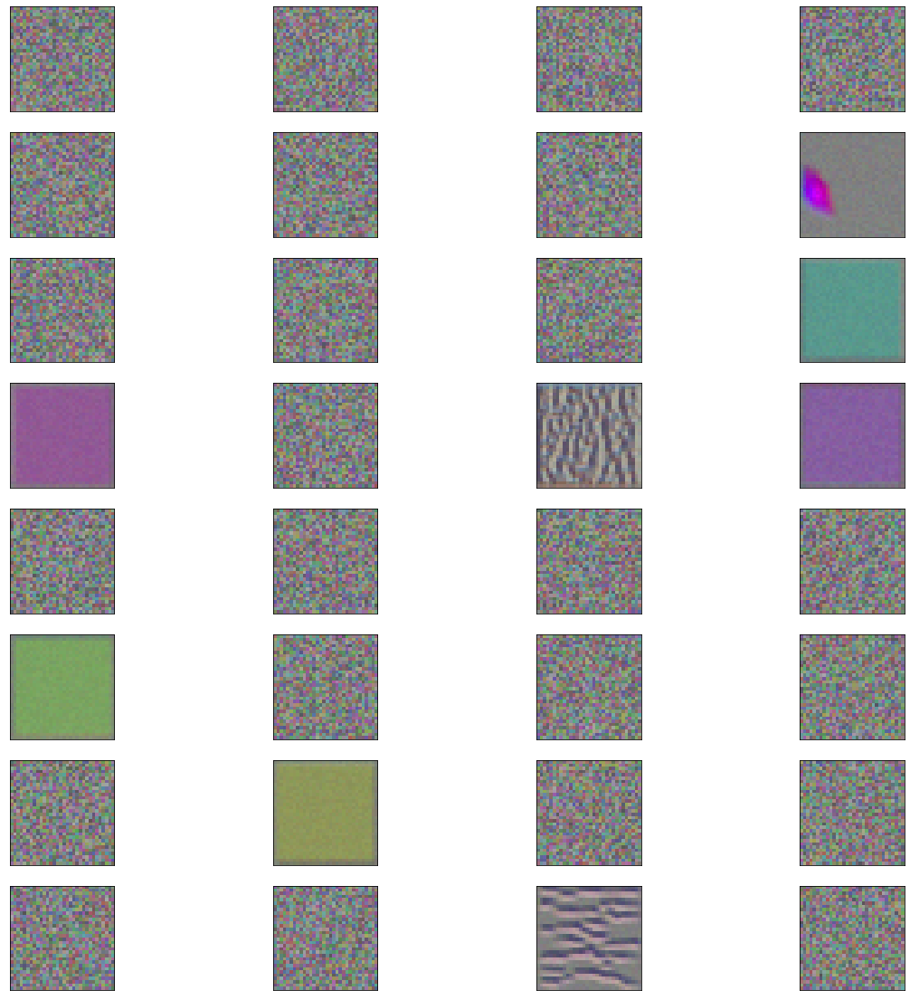

Tensor("activation_2/Relu:0", shape=(None, 47, 47, 64), dtype=float32)
64
(8, 8)


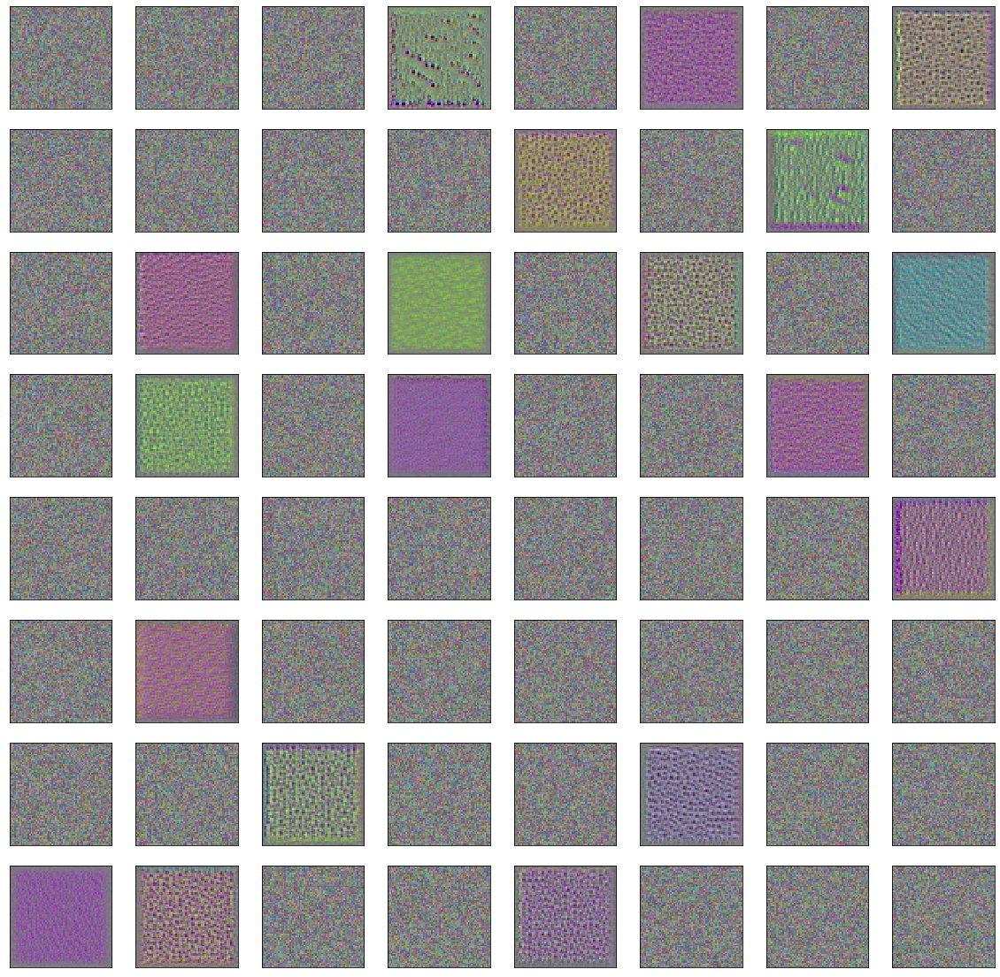

Tensor("activation_3/Relu:0", shape=(None, 21, 21, 128), dtype=float32)
128
(16, 8)


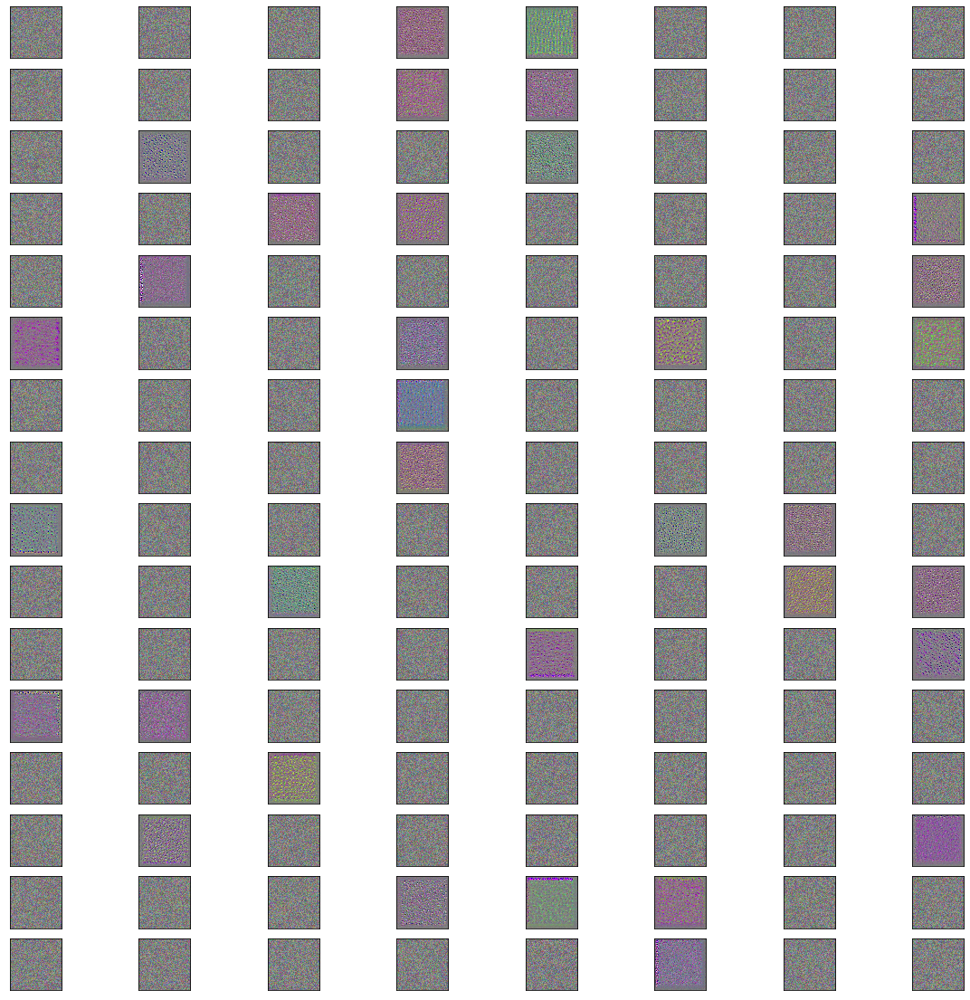

Tensor("activation_4/Relu:0", shape=(None, 8, 8, 128), dtype=float32)
128
(16, 8)


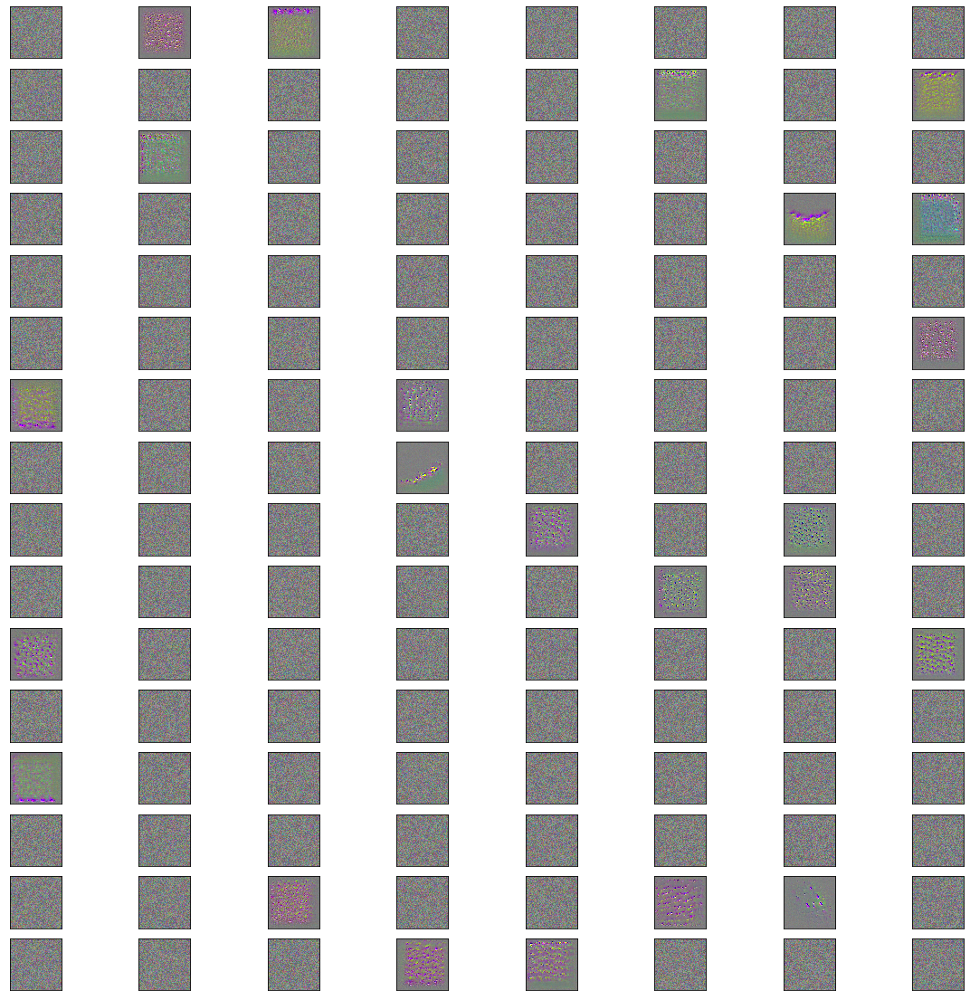

In [35]:
# plot the filters for convolutional layers utilizing gradient decompositiong
sizes = [32,64,128,128]
num_rows_and_columns = [(8,4),(8,8),(16,8),(16,8),(16,8),(16,8)]
index = 1
for layer_name, size, c_and_n in zip(layer_names[1:14:4], sizes, num_rows_and_columns):
    print(model.get_layer(layer_name).output)
    print(size)
    print(c_and_n)
    plt.figure(figsize=(20,20), facecolor='w')
    plt.title(layer_name)
    for i in range(size):
        filter_img = generate_pattern(layer_name, i, size=size)
        plt.subplot(c_and_n[0],c_and_n[1],index)
        plt.imshow(filter_img)
        plt.xticks([])
        plt.yticks([])
        index = index + 1
    index = 1
    plt.show()